# Anti-Aliasing Scheme for Deep Prior Interpolation

We modify the cost function as follows. First, we fit the modeling relation in the low-end of the spectrum, after filtering trace-by-trace:

$$\arg \min_\theta \Vert \mathbf{M} f_\theta(\mathbf{z}) - \mathcal{F}\mathbf{d} \Vert_2^2$$
where $\mathcal{F}$ is a 1D low-pass filter that acts along the time axis (i.e., trace by trace.

Then, we estimate the local dips from $f_\theta(\mathbf{z})$ using the Structure Tensor algorithm; on top of the dips we build the directional Laplacian operator $\overrightarrow{\nabla}$.

Thus, the interpolated data are obtained as:

$$\arg \min_\theta \Vert \mathbf{M} f_\theta(\mathbf{z}) - \mathbf{d} \Vert_2^2 + \lambda \Vert \overrightarrow{\nabla} f_\theta(\mathbf{z}) \Vert_2^2$$ 

In [1]:
from argparse import Namespace
import os
import numpy as np
import matplotlib.pyplot as plt

import torch
import architectures as A
import utils as u

print(f"torch: {torch.__version__}")

torch: 1.7.0


In [2]:
args = Namespace()

args.missing_perc = 66

args.net = 'skip'
args.act_fun = 'LeakyReLU'
args.last_act_fun = None
args.need_bias = False
args.filters = [128]*5
args.skip = [32]*5
args.inputdepth = 32
args.upsample = 'nearest'
args.inittype = 'xavier'
args.initgain = 0.02

args.param_noise = False
args.reg_noise_std = 0.03
args.noise_dist = 'n'
args.noise_std = .1

args.noise_var = .1
args.optimizer = 'adam'
args.decay = 1e-5
args.lr = 1e-3                      
args.reduce_lr = False
args.lr_factor = .9
args.lr_thresh = 1e-6
args.lr_patience = 80

args.epochs = 10001
args.switch = 3000
args.smooth_low = 3
args.smooth_hi = 6
args.dips_every=3000
args.lmbda = 5e0
args.grad_clipping = False

args.gpu = 4
args.PLOT = True
args.show_every = 250

args.cutoff = 50. 
args.ntaps = 101

u.set_seed(0)
u.set_gpu(args.gpu)
dtype = torch.cuda.FloatTensor

GPU selected: 4 - TITAN V


## Data

In [3]:
dataset = np.load('datasets/lines/less_steep.npy', allow_pickle=True).item()
data = dataset['data']
mask = u.build_mask(data, args.missing_perc/100, True)

In [4]:
nt, nx = data.shape
dt = dataset['dt']
dx = dataset['dx']
taxis = np.arange(nt)*dt
xaxis = np.arange(nx)*dx

nfft, nffk = 2**u.nextpow2(nt), 2**u.nextpow2(nx)

dk = 1 / (nx * dx)
ok = -dk * nx / 2.0
dw = 1 / (nt * dt)
ow = -dw * nt / 2.0
k = np.linspace(ok, ok + (nx - 1) * dk, nfft)
w = np.linspace(ow, ow + (nt - 1) * dw, nffk)

fft = lambda x: np.fft.fftshift(np.fft.fft2(x, (nfft, nffk)))
fft_abs = lambda x: np.abs(fft(x))

In [5]:
img_ = u.np_to_torch(data).type(dtype)
mask_ = u.np_to_torch(mask).type(dtype)
data_ = img_ * mask_
mse = torch.nn.MSELoss().type(dtype)
mae = torch.nn.L1Loss().type(dtype)
l1norm = lambda x: mae(x, torch.zeros_like(x))
l2norm = lambda x: mse(x, torch.zeros_like(x))

opts_data = dict(cmap='bone', clim=u.clim(data, 95), aspect='auto', interpolation='none', extent=[xaxis[0]/1000, xaxis[-1]/1000,taxis[-1], taxis[0]])
opts_fk = dict(cmap='jet', vmax=u.clim(fft_abs(data), 99)[1], aspect='auto', extent=[k[0]*1000,k[-1]*1000,w[0],w[-1]])
opts_dips = dict(clim=(-np.pi/2,np.pi/2), cmap='jet', aspect='auto', extent=opts_data['extent'])
opts_ani = dict(clim=(0,1), cmap='jet', aspect='auto', extent=opts_data['extent'])

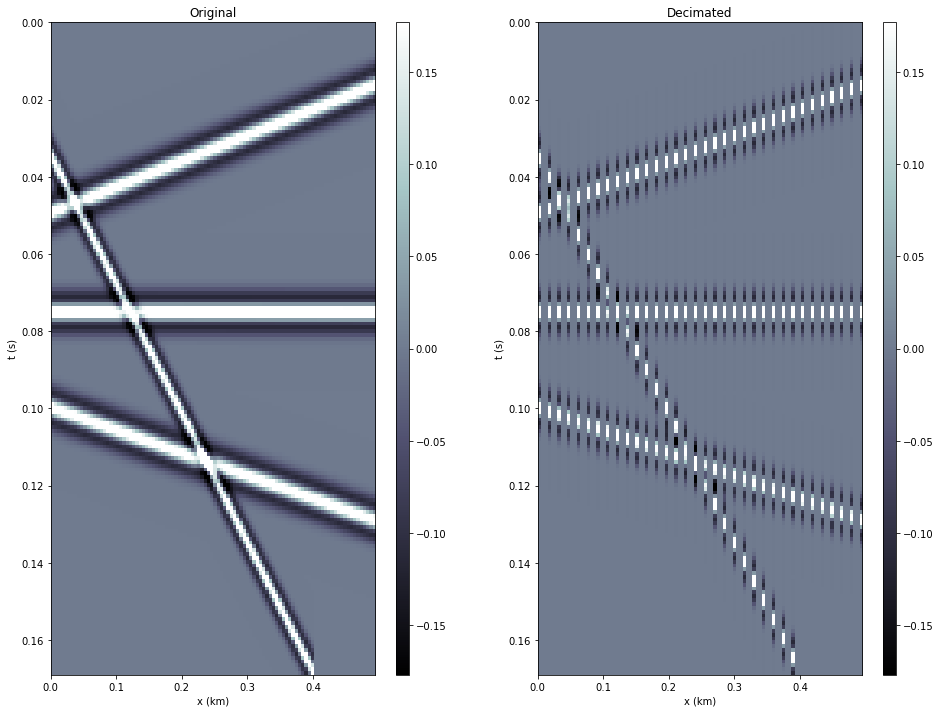

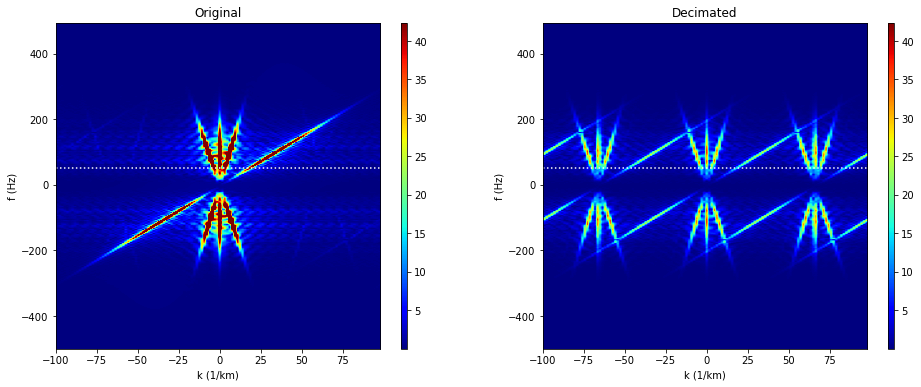

In [6]:
plt.figure(figsize=(16,12))
plt.subplot(121), plt.imshow(data, **opts_data)
plt.xlabel('x (km)'), plt.ylabel('t (s)')
plt.colorbar(aspect=50), plt.title('Original')
plt.subplot(122), plt.imshow(mask*data, **opts_data)
plt.xlabel('x (km)'), plt.ylabel('t (s)')
plt.colorbar(aspect=50), plt.title('Decimated')
plt.show()

plt.figure(figsize=(16,6))
plt.subplot(121), plt.imshow(fft_abs(data), **opts_fk)
plt.xlabel('k (1/km)'), plt.ylabel('f (Hz)')
plt.title('Original')
plt.colorbar(aspect=50)
plt.hlines(args.cutoff, *opts_fk['extent'][:2], 'w', ':')
plt.subplot(122), plt.imshow(fft_abs(mask*data), **opts_fk)
plt.xlabel('k (1/km)'), plt.ylabel('f (Hz)')
plt.title('Decimated')
plt.colorbar(aspect=50)
plt.hlines(args.cutoff, k[0]*1000, k[-1]*1000, 'w', ':')
plt.show()

## Low-pass filtering trace-by-trace

In [7]:
LPF = u.LowPassButterworth2D(fc=args.cutoff, fs=1/dt, ntaps=args.ntaps, nfft=nfft, dtype=dtype)

In [8]:
data_alias = []
for x in range(nx):
    if all(mask[:,x]==1):
        data_alias.append(data[:,x])
data_alias = np.asarray(data_alias).T

data_alias_ = u.np_to_torch(data_alias).type(dtype)
data_alias_lpf_ = LPF(data_alias_)

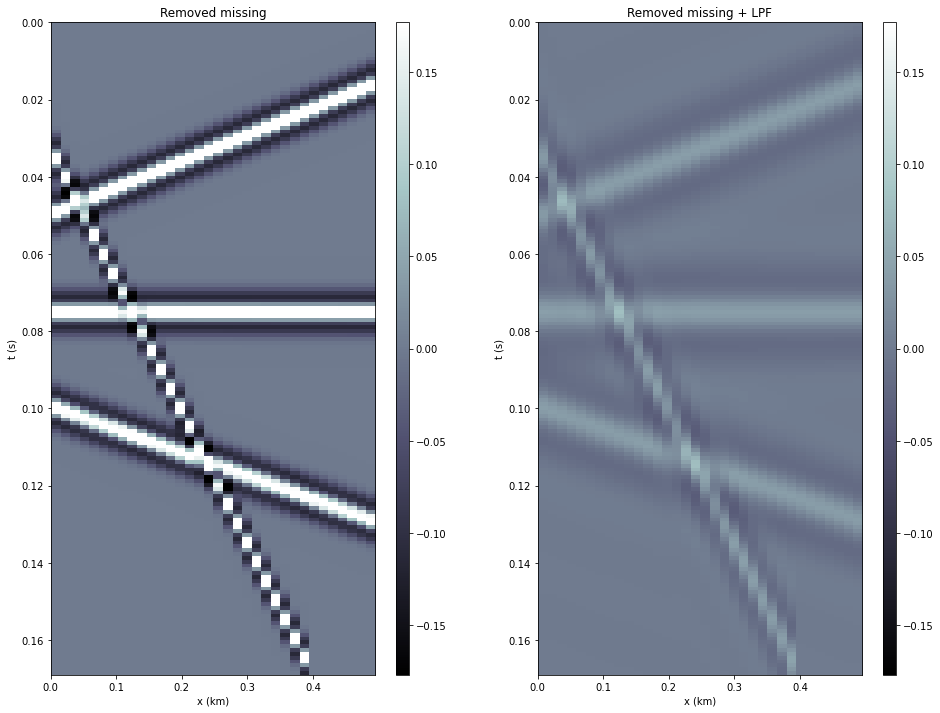

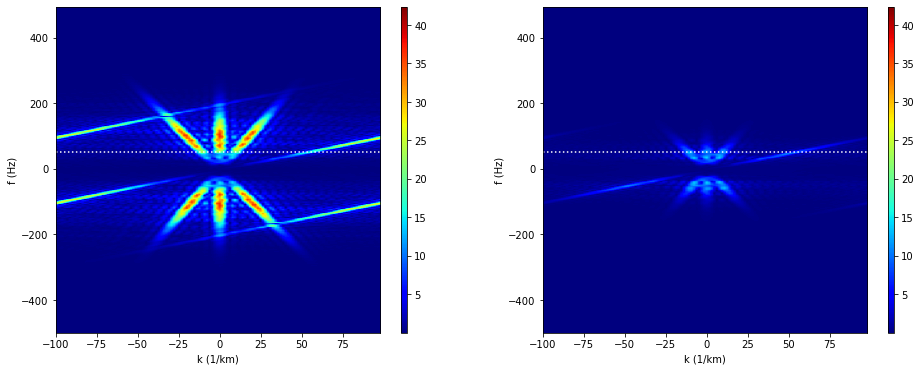

In [9]:
plt.figure(figsize=(16,12))
plt.subplot(121), plt.imshow(u.torch_to_np(data_alias_), **opts_data)
plt.xlabel('x (km)'), plt.ylabel('t (s)')
plt.colorbar(aspect=50), plt.title('Removed missing')
plt.subplot(122), plt.imshow(u.torch_to_np(data_alias_lpf_), **opts_data)
plt.xlabel('x (km)'), plt.ylabel('t (s)')
plt.colorbar(aspect=50), plt.title('Removed missing + LPF')
plt.show()

plt.figure(figsize=(16,6))
plt.subplot(121), plt.imshow(fft_abs(u.torch_to_np(data_alias_)), **opts_fk)
plt.xlabel('k (1/km)'), plt.ylabel('f (Hz)')
plt.colorbar(aspect=50)
plt.hlines(args.cutoff, *opts_fk['extent'][:2], 'w', ':')
plt.subplot(122), plt.imshow(fft_abs(u.torch_to_np(data_alias_lpf_)), **opts_fk)
plt.xlabel('k (1/km)'), plt.ylabel('f (Hz)')
plt.colorbar(aspect=50)
plt.hlines(args.cutoff, *opts_fk['extent'][:2], 'w', ':')
plt.show()

## Directional Laplacian

In [10]:
theta_true, ani_true = u.structure_tensor_dips(img_, smooth=args.smooth_hi)
theta_lpf, ani_lpf = u.structure_tensor_dips(LPF(img_), smooth=args.smooth_low)

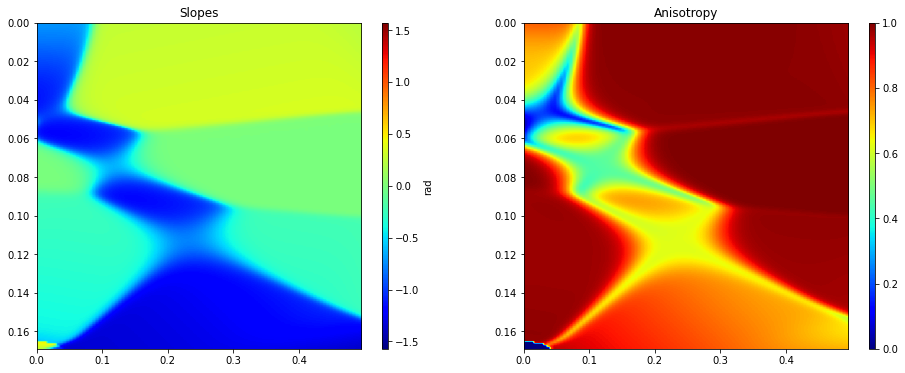

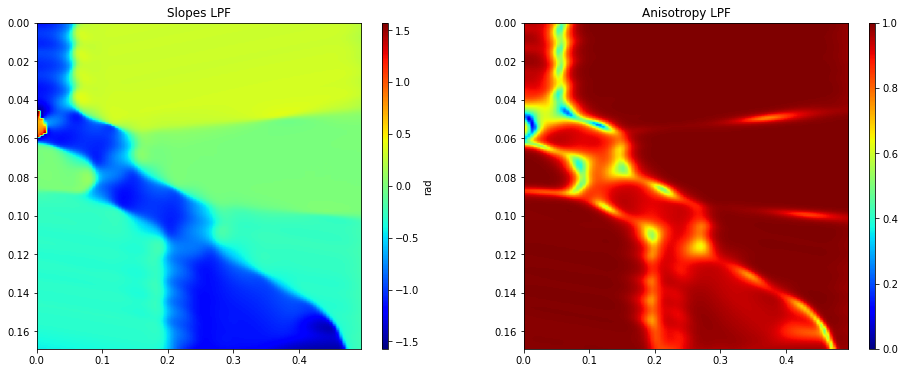

In [11]:
plt.figure(figsize=(16,6))
plt.subplot(121), plt.title('Slopes')
plt.imshow(u.torch_to_np(theta_true), **opts_dips)
plt.colorbar(aspect=50, label='rad')
plt.subplot(122), plt.title('Anisotropy')
plt.imshow(u.torch_to_np(ani_true), **opts_ani)
plt.colorbar(aspect=50)
plt.show()

plt.figure(figsize=(16,6))
plt.subplot(121), plt.title('Slopes LPF')
plt.imshow(u.torch_to_np(theta_lpf), **opts_dips)
plt.colorbar(aspect=50, label='rad')
plt.subplot(122), plt.title('Anisotropy LPF')
plt.imshow(u.torch_to_np(ani_lpf), **opts_ani)
plt.colorbar(aspect=50)
plt.show()

## Inversion

In [12]:
def plot_iterations(inputs: torch.Tensor,
                    targets: torch.Tensor,
                    outputs: torch.Tensor,
                    slopes: torch.Tensor = None,
                    anisotropy: torch.Tensor = None,
                    lapl: torch.Tensor = None,
                    title: str = None):
    
    fig, ax = plt.subplots(1,6,figsize=(15,4), sharey=True)
    
    ax[0].imshow(u.torch_to_np(inputs), **opts_data) 
    ax[0].set_ylabel('Time (s)')
    ax[0].set_title('input')
    
    ax[1].imshow(u.torch_to_np(targets), **opts_data) 
    ax[1].set_title('target')
    
    ax[2].imshow(u.torch_to_np(outputs), **opts_data) 
    ax[2].set_title('output')
    
    if slopes is not None:
        ax[3].imshow(u.torch_to_np(outputs), **opts_data) 
        ax[3].imshow(u.torch_to_np(slopes), alpha=0.3, **opts_dips) 
        ax[3].set_title('slopes')
        
    if anisotropy is not None:
        ax[4].imshow(u.torch_to_np(outputs), **opts_data) 
        ax[4].imshow(u.torch_to_np(anisotropy), alpha=0.3, **opts_ani) 
        ax[4].set_title('anisotropy')
    
    if lapl is not None:
        _lapl = u.torch_to_np(lapl)
        ax[5].imshow(_lapl, aspect='auto', cmap='bone', extent=opts_data['extent'],
                     #clim=tuple(np.asarray(opts_data['clim'])/2)
                    ) 
        ax[5].set_title(r'$\overrightarrow{\nabla}$')
    
    for a in ax:
        a.set_xlabel('X (km)')
    
    plt.suptitle(title,fontsize=14)

    plt.tight_layout(pad=.5)
    plt.show()

In [13]:
def get_net_opt_sched(args, channels, dtype, data_shape):
    if args.net == 'skip':
        net = A.Skip(args.inputdepth, channels, 
                    num_channels_down = args.filters,
                    num_channels_up =   args.filters,
                    num_channels_skip = args.skip,  
                    filter_size_up = 3, filter_size_down = 3, 
                    upsample_mode=args.upsample, filter_skip_size=1,
                    last_act_fun=args.last_act_fun, need_bias=args.need_bias, pad='reflection', act_fun=args.act_fun)
    else:
        net = A.MulResUnet(
            num_input_channels=args.inputdepth,
            num_output_channels=channels,
            num_channels_down=args.filters,
            num_channels_up=args.filters,
            num_channels_skip=args.skip,
            upsample_mode=args.upsample,
            last_act_fun=args.last_act_fun,
            need_bias=args.need_bias,
            act_fun=args.act_fun
        )

    net = net.type(dtype)
    
    net_input = args.noise_std * u.get_noise(shape=(1, args.inputdepth)+data_shape,
                                         noise_type=args.noise_dist).type(dtype)

    if args.optimizer.lower() == 'adam':
        opt = torch.optim.Adam(u.get_params('net', net, net_input), lr=args.lr)#, weight_decay=args.decay)
    elif args.optimizer.lower() == 'adamw':
        opt = torch.optim.AdamW(u.get_params('net', net, net_input), lr=args.lr, weight_decay=args.decay)
    else:
        opt = torch.optim.SGD(u.get_params('net', net, net_input), lr=args.lr, weight_decay=args.decay)

    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt,
                                                       mode='min',
                                                       factor=args.lr_factor,
                                                       threshold=args.lr_thresh,
                                                       patience=args.lr_patience)
    
    return net, opt, sched, net_input

In [14]:
data_lpf_ = LPF(data_)
img_lpf_ = LPF(img_)

In [15]:
net, opt, sched, net_input = get_net_opt_sched(args, channels=1, dtype=dtype, data_shape=data.shape)

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

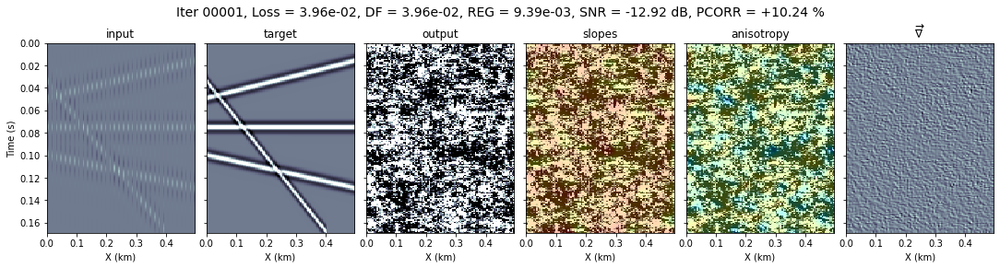

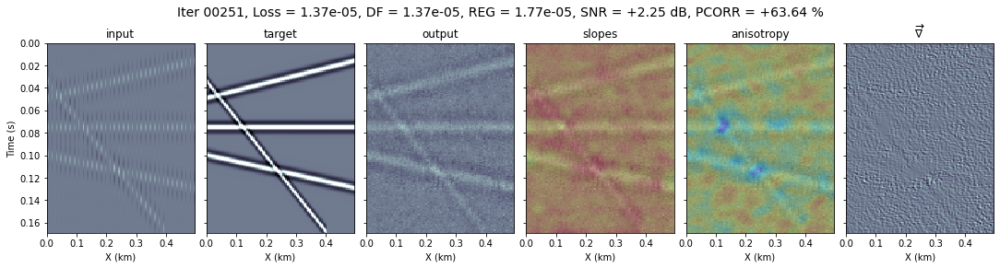

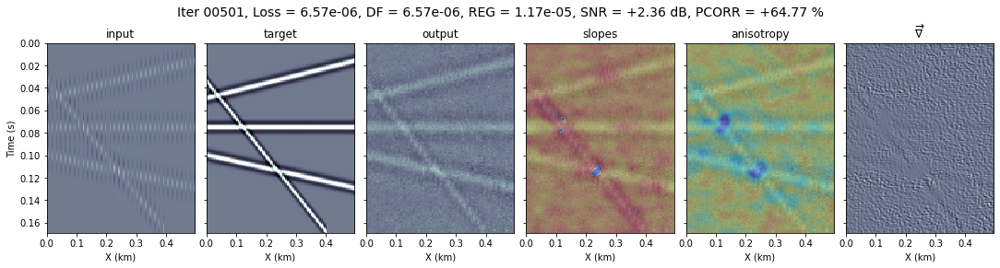

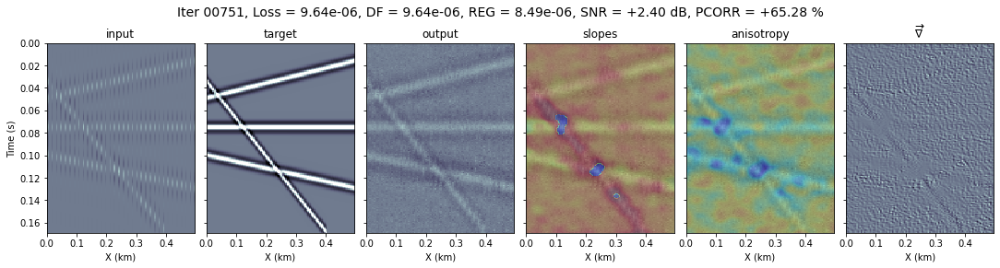

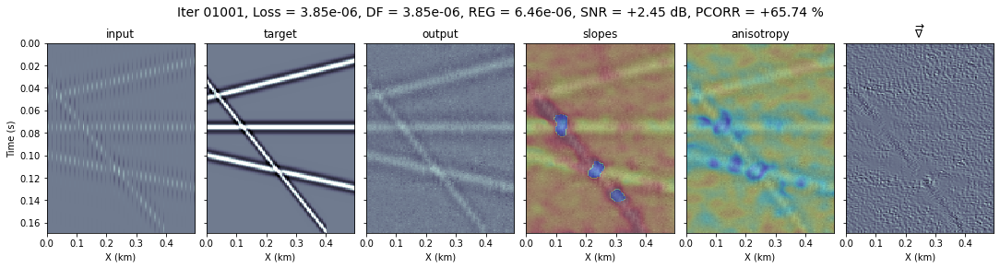

...

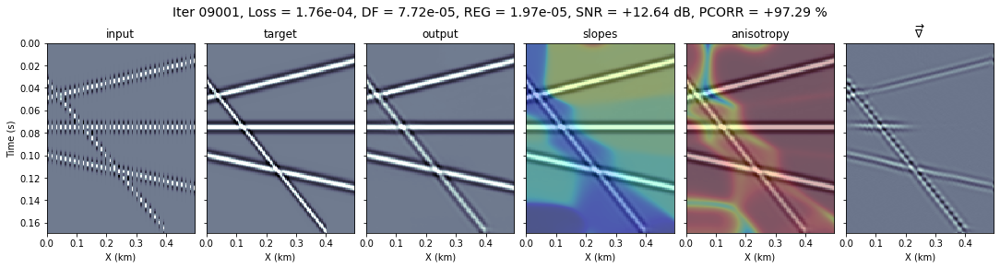

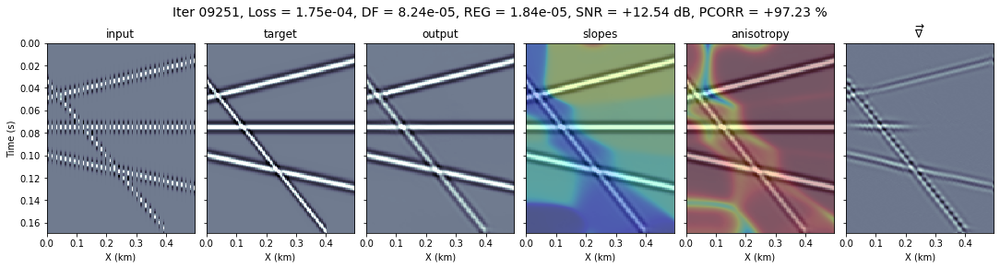

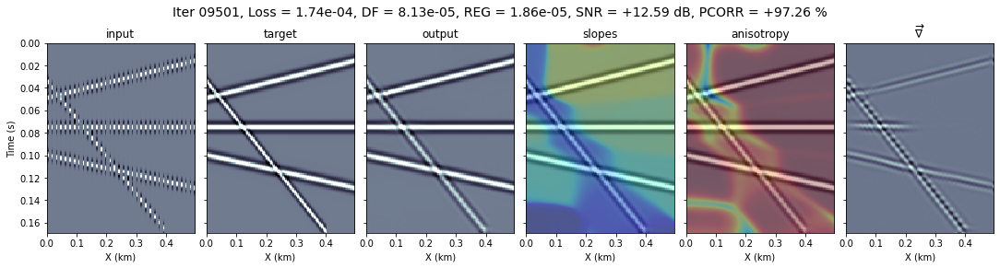

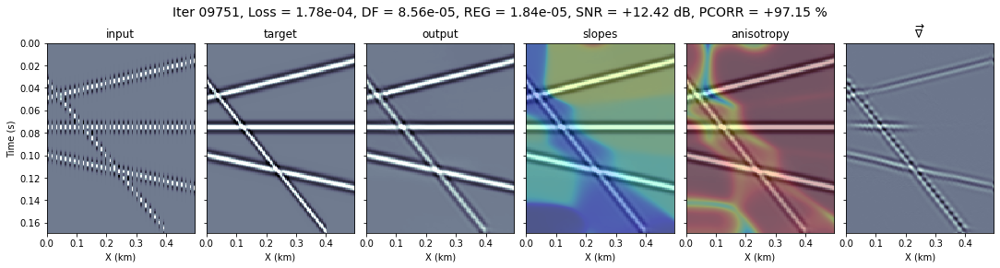

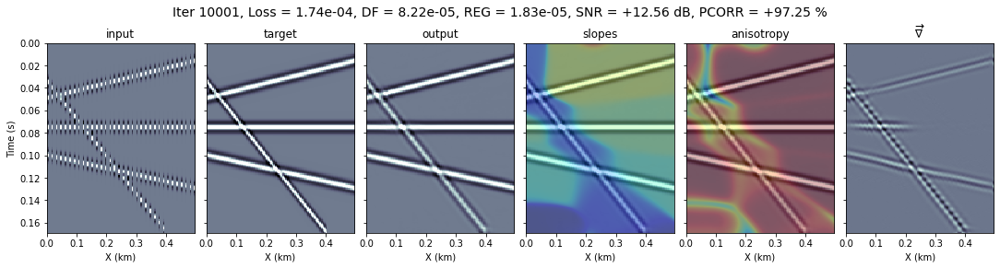

In [16]:
history_alias = u.HistoryReg(args.epochs)

for i in range(args.epochs):
    opt.zero_grad()
    
    if args.param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if args.reg_noise_std > 0:
        net_input = net_input + (noise.normal_() * args.reg_noise_std)
        
    out = net(net_input)
    
    # Loss
    if i<args.switch:
        theta, ani = u.structure_tensor_dips(out, smooth=args.smooth_low)
        Hale = u.Hale2D(theta.detach())
        lapl = Hale(out) * torch.pow(ani.detach(), 2)
        lapl_fn = l2norm(lapl)
        
        df_full = mse(out * mask_, data_lpf_)
        total_loss = df_full
    
    else:
        if i % args.dips_every == 0:
            theta, ani = u.structure_tensor_dips(LPF(out), smooth=args.smooth_hi)
            Hale = u.Hale2D(theta.detach())
        
        lapl = Hale(out) * torch.pow(ani.detach(), 2)
        lapl_fn = l2norm(lapl)
        
        df_full = mse(out * mask_, data_)
        total_loss = df_full + args.lmbda*lapl_fn
    
    total_loss.backward()

    if args.grad_clipping:
        torch.nn.utils.clip_grad_norm_(net.parameters(), 0.001)
    
    # log history
    out_for_metrics = out.clone().detach()
    out_for_metrics[mask_ == 1] = img_[mask_ == 1]
    
    history_alias.append((total_loss.detach().cpu().item(),
                          df_full.detach().cpu().item(),
                          lapl_fn.detach().cpu().item(),
                          u.snr(out_for_metrics, img_).detach().cpu().item(),
                          u.pcorr(out_for_metrics, img_).detach().cpu().item()))
    print(history_alias.log_message(i), '\r', end='')

    if args.PLOT and i % args.show_every == 0:
        plot_iterations(
            inputs=data_lpf_ if i<args.switch else data_,
            targets=img_,
            outputs=out,
            slopes=theta,
            anisotropy=ani,
            lapl=lapl,
            title=history_alias.log_message(i))
        
    opt.step()
    history_alias.lr.append(opt.param_groups[0]['lr'])
    if args.reduce_lr:
        sched.step(total_loss)

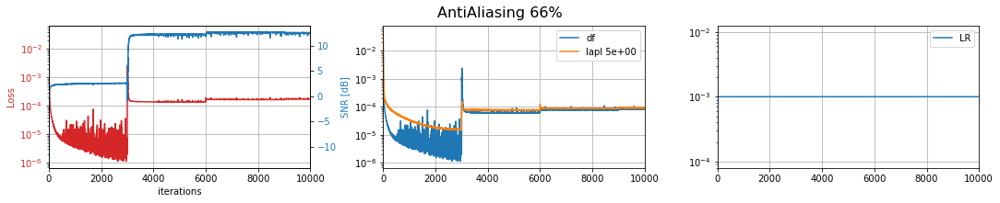

In [17]:
fig, ax = plt.subplots(1,3,figsize=(15,3))

ax[0].set_xlabel('iterations')
ax[0].set_ylabel('Loss', color='tab:red')
ax[0].semilogy(history_alias.loss, color='tab:red')
ax[0].tick_params(axis='y', labelcolor='tab:red')
ax[0].grid(True)

ax[0] = ax[0].twinx()
ax[0].set_ylabel('SNR [dB]', color='tab:blue')
ax[0].plot(history_alias.snr, color='tab:blue')
ax[0].tick_params(axis='y', labelcolor='tab:blue')

ax[1].semilogy(history_alias.df, label='df')
ax[1].semilogy([args.lmbda*l for l in history_alias.reg], label='lapl %.e' % args.lmbda)
ax[1].legend(loc='upper right')
ax[1].grid(True)

ax[2].semilogy(history_alias.lr, label='LR')
ax[2].legend()
ax[2].grid(True)

for a in ax:
    a.set_xlim(0, args.epochs)

fig.suptitle('AntiAliasing %d%%' % args.missing_perc, fontsize=16)
fig.tight_layout(pad=.5)
plt.show()

In [18]:
out_alias = net(net_input)

## Now with traditional DIP, for comparison

In [19]:
net_old, opt_old, sched_old, net_input = get_net_opt_sched(args, channels=1, dtype=dtype, data_shape=data.shape)

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

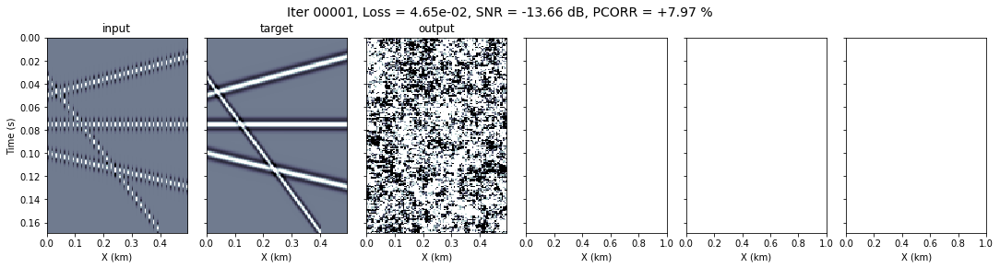

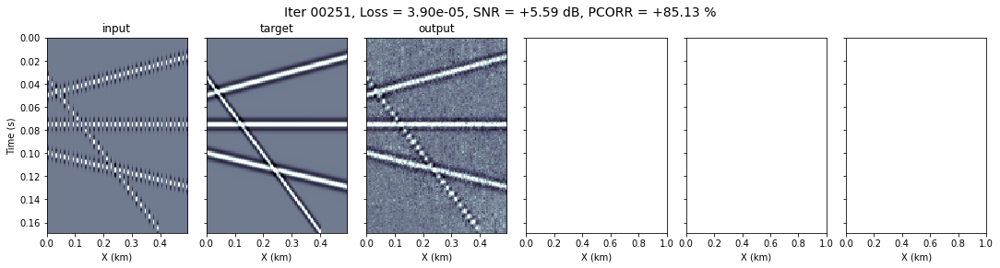

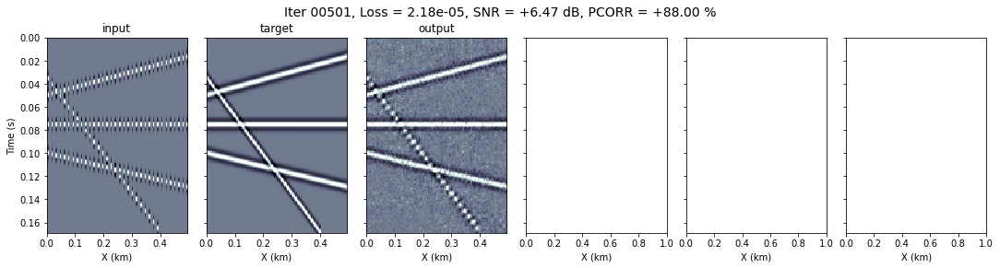

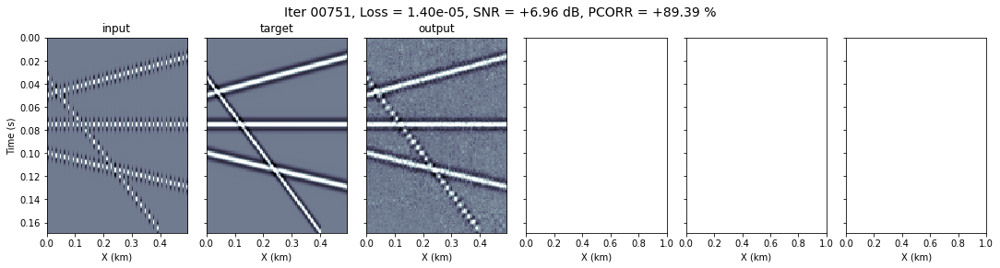

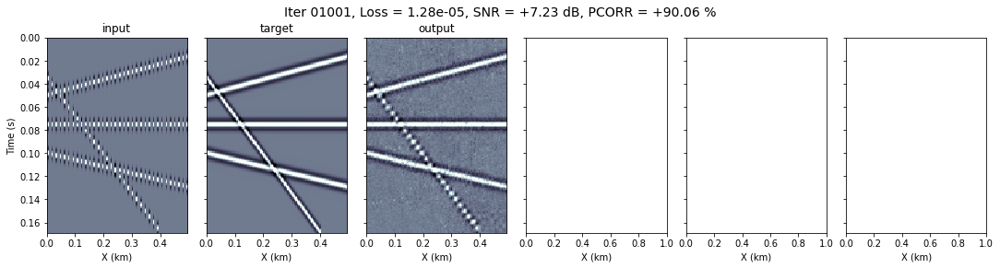

...

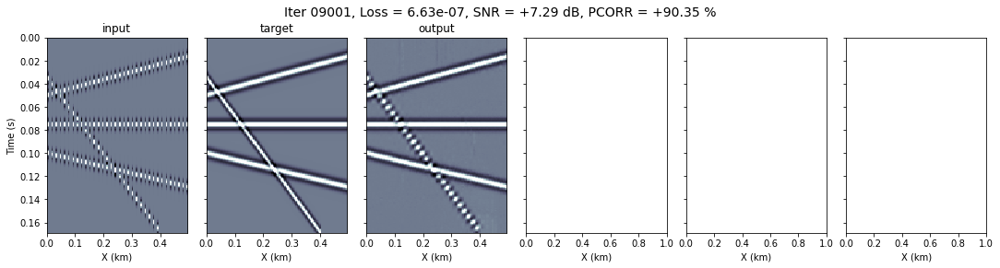

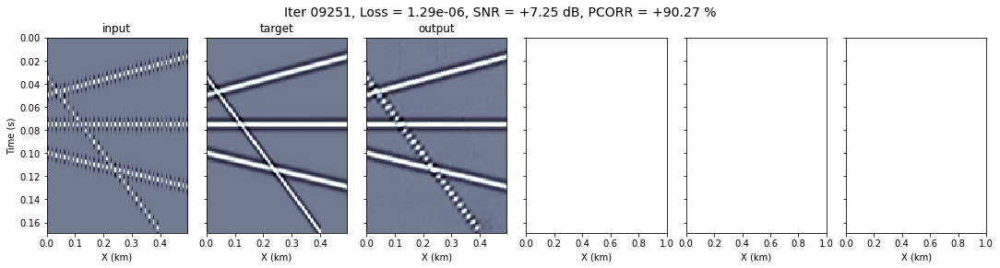

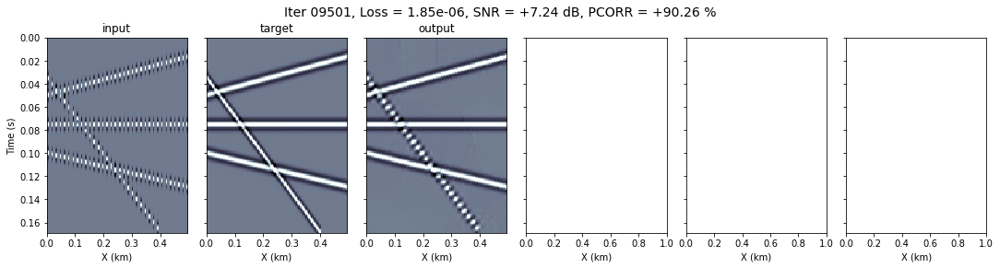

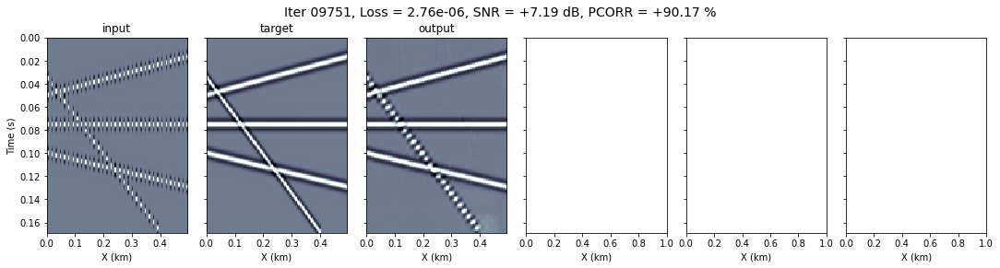

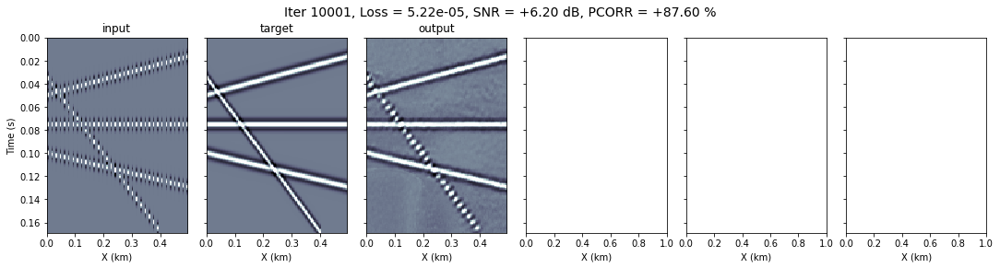

In [20]:
history_old = u.History(args.epochs)

for i in range(args.epochs):
    opt_old.zero_grad()
    
    if args.param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50
    
    net_input = net_input_saved
    if args.reg_noise_std > 0:
        net_input = net_input + (noise.normal_() * args.reg_noise_std)
        
    out = net_old(net_input)
    
    # Loss
    total_loss = mse(out * mask_, data_)

    total_loss.backward()

    if args.grad_clipping:
        torch.nn.utils.clip_grad_norm_(net.parameters(), 0.001)
    
    # log history
    out_for_metrics = out.clone().detach()
    out_for_metrics[mask_ == 1] = img_[mask_ == 1]
    
    history_old.append((total_loss.detach().cpu().item(),
                        u.snr(out_for_metrics, img_).detach().cpu().item(),
                        u.pcorr(out_for_metrics, img_).detach().cpu().item()))
    
    print(history_old.log_message(i), '\r', end='')

    if args.PLOT and i % args.show_every == 0:
        plot_iterations(
            inputs=data_,
            targets=img_,
            outputs=out,
            title=history_old.log_message(i))
        
    opt_old.step()
    history_old.lr.append(opt_old.param_groups[0]['lr'])
    if args.reduce_lr:
        sched_old.step(total_loss)

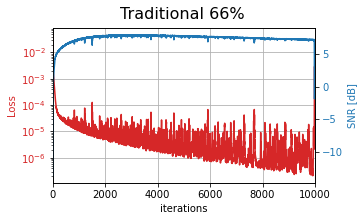

In [21]:
fig, ax = plt.subplots(figsize=(5,3))

ax.set_xlabel('iterations')
ax.set_ylabel('Loss', color='tab:red')
ax.semilogy(history_old.loss, color='tab:red')
ax.tick_params(axis='y', labelcolor='tab:red')
ax.grid(True)

ax = ax.twinx()
ax.set_ylabel('SNR [dB]', color='tab:blue')
ax.plot(history_old.snr, color='tab:blue')
ax.tick_params(axis='y', labelcolor='tab:blue')

ax.set_xlim(0, args.epochs)

fig.suptitle('Traditional %d%%' % args.missing_perc, fontsize=16)
fig.tight_layout(pad=.5)
plt.show()

In [22]:
out_trad = net_old(net_input)

## Comparison

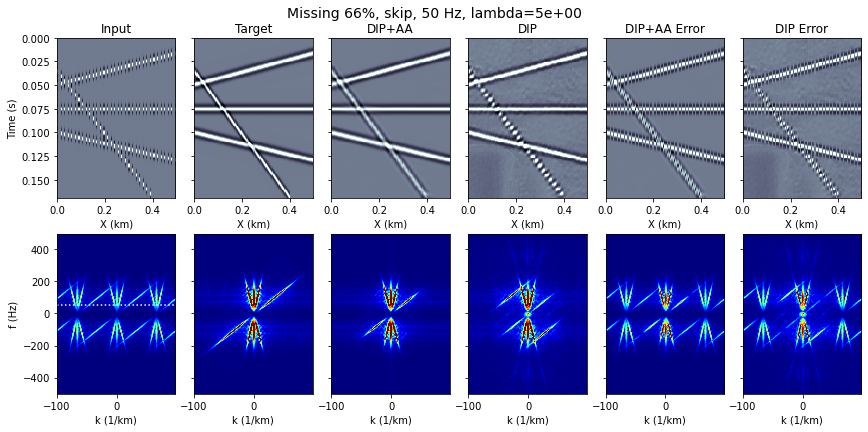

In [23]:
fig, ax = plt.subplots(2,6,figsize=(12,6), sharey='row')

ax[0,0].imshow(mask*data, **opts_data) 
ax[0,0].set_ylabel('Time (s)')
ax[0,0].set_title('Input')

ax[0,1].imshow(data, **opts_data) 
ax[0,1].set_title('Target')

ax[0,2].imshow(u.torch_to_np(out_alias), **opts_data) 
ax[0,2].set_title('DIP+AA')

ax[0,3].imshow(u.torch_to_np(out_trad), **opts_data) 
ax[0,3].set_title('DIP')

ax[0,4].imshow(u.torch_to_np(out_alias) - mask*data, **opts_data) 
ax[0,4].set_title('DIP+AA Error')

ax[0,5].imshow(u.torch_to_np(out_trad) - mask*data, **opts_data) 
ax[0,5].set_title('DIP Error')

for a in ax[0]:
    a.set_xlabel('X (km)')

ax[1,0].imshow(fft_abs(data*mask), **opts_fk) 
ax[1,0].set_ylabel('f (Hz)')
ax[1,0].hlines(args.cutoff, *opts_fk['extent'][:2], 'w', ':')

ax[1,1].imshow(fft_abs(data), **opts_fk) 
ax[1,2].imshow(fft_abs(u.torch_to_np(out_alias)), **opts_fk) 
ax[1,3].imshow(fft_abs(u.torch_to_np(out_trad)), **opts_fk) 
ax[1,4].imshow(fft_abs(u.torch_to_np(out_alias)-mask*data), **opts_fk)
ax[1,5].imshow(fft_abs(u.torch_to_np(out_trad)-mask*data), **opts_fk) 

for a in ax[1]:
    a.set_xlabel('k (1/km)')

fig.suptitle('Missing %d%%, %s, %d Hz, lambda=%.e' % (args.missing_perc, args.net, args.cutoff, args.lmbda), fontsize=14)
fig.tight_layout(pad=.5)
plt.show()

In [24]:
np.save('./results/antialiasing/lines.npy',
        dict(args=args,
             out_dip=u.torch_to_np(out_trad),
             out=u.torch_to_np(out_alias),
             history=history_alias.__dict__,
             history_dip=history_old.__dict__,
             slopes=u.torch_to_np(theta),
             anisotropy=u.torch_to_np(ani),
             dt=dt,
             dx=dx,
             mask=mask,
             data=data,
            )
       )